In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from os.path import splitext,basename
from keras.models import model_from_json
import glob
from matplotlib import gridspec

In [ ]:
# pylint: disable=invalid-name, redefined-outer-name, missing-docstring, non-parent-init-called, trailing-whitespace, line-too-long
import cv2
import numpy as np

class Label:
    def __init__(self, cl=-1, tl=np.array([0., 0.]), br=np.array([0., 0.]), prob=None):
        self.__tl = tl
        self.__br = br
        self.__cl = cl
        self.__prob = prob

    def __str__(self):
        return 'Class: %d, top left(x: %f, y: %f), bottom right(x: %f, y: %f)' % (
        self.__cl, self.__tl[0], self.__tl[1], self.__br[0], self.__br[1])

    def copy(self):
        return Label(self.__cl, self.__tl, self.__br)

    def wh(self): return self.__br - self.__tl

    def cc(self): return self.__tl + self.wh() / 2

    def tl(self): return self.__tl

    def br(self): return self.__br

    def tr(self): return np.array([self.__br[0], self.__tl[1]])

    def bl(self): return np.array([self.__tl[0], self.__br[1]])

    def cl(self): return self.__cl

    def area(self): return np.prod(self.wh())

    def prob(self): return self.__prob

    def set_class(self, cl):
        self.__cl = cl

    def set_tl(self, tl):
        self.__tl = tl

    def set_br(self, br):
        self.__br = br

    def set_wh(self, wh):
        cc = self.cc()
        self.__tl = cc - .5 * wh
        self.__br = cc + .5 * wh

    def set_prob(self, prob):
        self.__prob = prob

class DLabel(Label):
    def __init__(self, cl, pts, prob):
        self.pts = pts
        tl = np.amin(pts, axis=1)
        br = np.amax(pts, axis=1)
        Label.__init__(self, cl, tl, br, prob)

def getWH(shape):
    return np.array(shape[1::-1]).astype(float)

def IOU(tl1, br1, tl2, br2):
    wh1, wh2 = br1-tl1, br2-tl2
    assert((wh1 >= 0).all() and (wh2 >= 0).all())
    
    intersection_wh = np.maximum(np.minimum(br1, br2) - np.maximum(tl1, tl2), 0)
    intersection_area = np.prod(intersection_wh)
    area1, area2 = (np.prod(wh1), np.prod(wh2))
    union_area = area1 + area2 - intersection_area
    return intersection_area/union_area

def IOU_labels(l1, l2):
    return IOU(l1.tl(), l1.br(), l2.tl(), l2.br())

def nms(Labels, iou_threshold=0.5):
    SelectedLabels = []
    Labels.sort(key=lambda l: l.prob(), reverse=True)
    
    for label in Labels:
        non_overlap = True
        for sel_label in SelectedLabels:
            if IOU_labels(label, sel_label) > iou_threshold:
                non_overlap = False
                break

        if non_overlap:
            SelectedLabels.append(label)
    return SelectedLabels



def find_T_matrix(pts, t_pts):
    A = np.zeros((8, 9))
    for i in range(0, 4):
        xi = pts[:, i]
        xil = t_pts[:, i]
        xi = xi.T
        
        A[i*2, 3:6] = -xil[2]*xi
        A[i*2, 6:] = xil[1]*xi
        A[i*2+1, :3] = xil[2]*xi
        A[i*2+1, 6:] = -xil[0]*xi

    [U, S, V] = np.linalg.svd(A)
    H = V[-1, :].reshape((3, 3))
    return H

def getRectPts(tlx, tly, brx, bry):
    return np.matrix([[tlx, brx, brx, tlx], [tly, tly, bry, bry], [1, 1, 1, 1]], dtype=float)

def normal(pts, side, mn, MN):
    pts_MN_center_mn = pts * side
    pts_MN = pts_MN_center_mn + mn.reshape((2, 1))
    pts_prop = pts_MN / MN.reshape((2, 1))
    return pts_prop

# Reconstruction function from predict value into plate crpoped from image
def reconstruct(I, Iresized, Yr, lp_threshold):
    # 4 max-pooling layers, stride = 2
    net_stride = 2**4
    side = ((208 + 40)/2)/net_stride

    # one line and two lines license plate size
    one_line = (470, 110)
    two_lines = (280, 200)

    Probs = Yr[..., 0]
    Affines = Yr[..., 2:]

    xx, yy = np.where(Probs > lp_threshold)
    # CNN input image size 
    WH = getWH(Iresized.shape)
    # output feature map size
    MN = WH/net_stride

    vxx = vyy = 0.5 #alpha
    base = lambda vx, vy: np.matrix([[-vx, -vy, 1], [vx, -vy, 1], [vx, vy, 1], [-vx, vy, 1]]).T
    labels = []
    labels_frontal = []

    for i in range(len(xx)):
        x, y = xx[i], yy[i]
        affine = Affines[x, y]
        prob = Probs[x, y]

        mn = np.array([float(y) + 0.5, float(x) + 0.5])

        # affine transformation matrix
        A = np.reshape(affine, (2, 3))
        A[0, 0] = max(A[0, 0], 0)
        A[1, 1] = max(A[1, 1], 0)
        # identity transformation
        B = np.zeros((2, 3))
        B[0, 0] = max(A[0, 0], 0)
        B[1, 1] = max(A[1, 1], 0)

        pts = np.array(A*base(vxx, vyy))
        pts_frontal = np.array(B*base(vxx, vyy))

        pts_prop = normal(pts, side, mn, MN)
        frontal = normal(pts_frontal, side, mn, MN)

        labels.append(DLabel(0, pts_prop, prob))
        labels_frontal.append(DLabel(0, frontal, prob))
        
    final_labels = nms(labels, 0.1)
    final_labels_frontal = nms(labels_frontal, 0.1)

    #print(final_labels_frontal)
    # assert final_labels_frontal, "No License plate is founded!"

    # LP size and type
    lp_type=1
    if len(final_labels_frontal):
        out_size, lp_type = (two_lines, 2) if ((final_labels_frontal[0].wh()[0] / final_labels_frontal[0].wh()[1]) < 1.7) else (one_line, 1)

    TLp = []
    Cor = []
    # print(final_labels)
    if len(final_labels):
        final_labels.sort(key=lambda x: x.prob(), reverse=True)
        for _, label in enumerate(final_labels):
            t_ptsh = getRectPts(0, 0, out_size[0], out_size[1])
            ptsh = np.concatenate((label.pts * getWH(I.shape).reshape((2, 1)), np.ones((1, 4))))
            H = find_T_matrix(ptsh, t_ptsh)
            Ilp = cv2.warpPerspective(I, H, out_size, borderValue=0)
            TLp.append(Ilp)
            Cor.append(ptsh)
    return final_labels, TLp, lp_type, Cor

def detect_lp(model, I, max_dim, lp_threshold):
    min_dim_img = min(I.shape[:2])
    factor = float(max_dim) / min_dim_img
    w, h = (np.array(I.shape[1::-1], dtype=float) * factor).astype(int).tolist()
    Iresized = cv2.resize(I, (w, h))
    T = Iresized.copy()
    T = T.reshape((1, T.shape[0], T.shape[1], T.shape[2]))
    Yr = model.predict(T)
    Yr = np.squeeze(Yr)
    #print(Yr.shape)
    L, TLp, lp_type, Cor = reconstruct(I, Iresized, Yr, lp_threshold)
    return L, TLp, lp_type, Cor


In [ ]:
def load_model(path):
    try:
        path = splitext(path)[0]
        with open('%s.json' % path, 'r') as json_file:
            model_json = json_file.read()
        model = model_from_json(model_json, custom_objects={})
        model.load_weights('%s.h5' % path)
        print("Loading model successfully...")
        return model
    except Exception as e:
        print(e)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## Trial with jasircodes
wpod_net_path = "/content/drive/MyDrive/OCR/wpod-net.json"
wpod_net = load_model(wpod_net_path)

Loading model successfully...


In [ ]:
wpod_net_path = "/content/drive/MyDrive/YOLOv5_LCPlate/wpod-net.json"
wpod_net = load_model(wpod_net_path)

Loading model successfully...


In [ ]:
import cv2

In [ ]:
def preprocess_image(image_path,resize=False):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img

def get_plate(image_path, Dmax=608, Dmin = 608,threshold=0.1):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=threshold)
    return vehicle, LpImg, cor

test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/N106.jpeg"
vehicle, LpImg,cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

error: ignored

Mounted at /content/drive


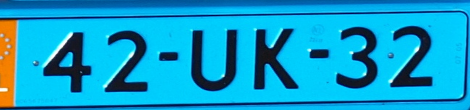

In [ ]:
from google.colab.patches import cv2_imshow
image = (LpImg[0]*255).astype(np.uint8)
cv2_imshow(image)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement python-opencv-4.2.0.32 (from versions: none)
ERROR: No matching distribution found for python-opencv-4.2.0.32


In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 70.8 MB 18 kB/s 
     |████████████████████████████████| 47.6 MB 1.3 MB/s 


In [ ]:
import easyocr
reader = easyocr.Reader(['en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

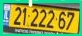

72122267


In [ ]:
import os
from google.colab.patches import cv2_imshow
img="/content/image.jpg"
from IPython.display import Image, display
display(Image(img))
bounds = reader.readtext("/content/image.jpg")
if len(bounds)>0:
    text=bounds[0][1]
    print(text)

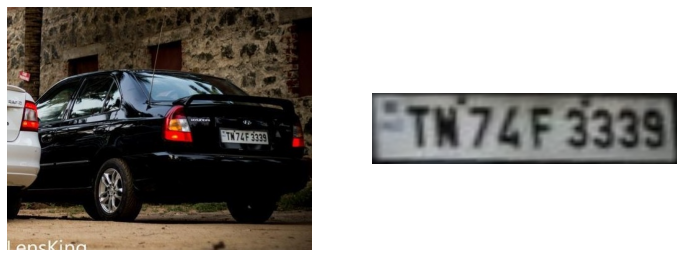

In [ ]:
def preprocess_image(image_path,resize=False):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img

def get_plate(image_path, Dmax=608, Dmin = 608,threshold=0.1):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=threshold)
    return vehicle, LpImg, cor

test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/N140.jpeg"
vehicle, LpImg,cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

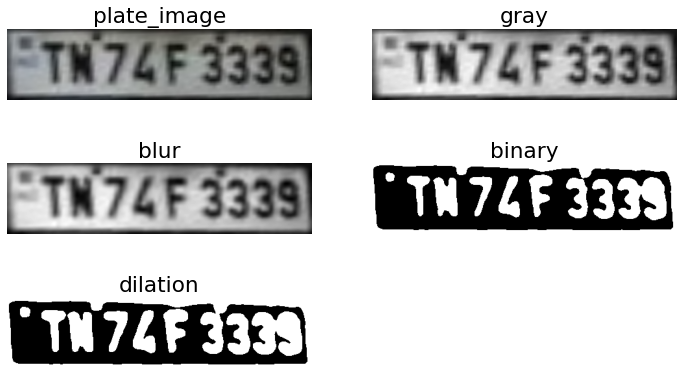

In [ ]:
if (len(LpImg)): #check if there is at least one license image
    # Scales, calculates absolute values, and converts the result to 8-bit.
    plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
    
    # convert to grayscale and blur the image
    gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(7,7),0)
    
    # Applied inversed thresh_binary 
    binary = cv2.threshold(blur, 180, 255,
                         cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)

    
# visualize results    
fig = plt.figure(figsize=(12,7))
plt.rcParams.update({"font.size":18})
grid = gridspec.GridSpec(ncols=2,nrows=3,figure = fig)
plot_image = [plate_image, gray, blur, binary,thre_mor]
plot_name = ["plate_image","gray","blur","binary","dilation"]

for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

TnTLf 3333


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  del sys.path[0]


F43339
F43339
F743339
Tn7Lf 3332
Tn7uf 3333


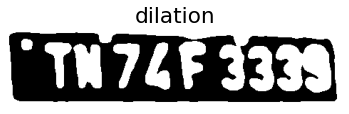

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
k = np.ones((4,2), np.uint8)
erosion = cv2.erode(plot_image[3], k, iterations=2)
bounds = reader.readtext(erosion)
if len(bounds)>0:
    text=bounds[0][1]
    print(text)
# plt.imshow(erosion,cmap="gray")
for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    bounds = reader.readtext(plot_image[i])
    if len(bounds)>0:
        text=bounds[0][1]
        print(text)
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

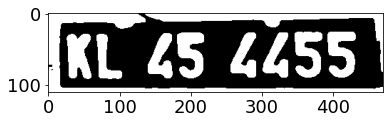

In [ ]:
plt.imshow(plot_image[4],cmap="gray")

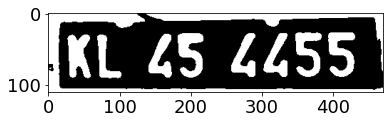

In [ ]:
plt.imshow(plot_image[3],cmap="gray")

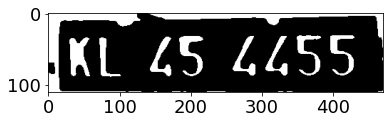

In [ ]:
k = np.ones((4,2), np.uint8)
erosion = cv2.erode(plot_image[3], k, iterations=2)
plt.imshow(erosion,cmap="gray")

KL L5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


KL L5 LL55
KL L5 LL55
KL L5 LL55
KL 45 LL5s
KL 45 LL5s


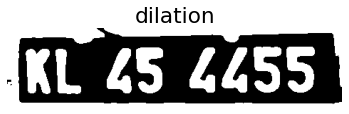

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
plt.imshow(erosion,cmap="gray")
bounds = reader.readtext(erosion)
if len(bounds)>0:
    text=bounds[0][1]
    print(text)
for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    bounds = reader.readtext(plot_image[i])
    if len(bounds)>0:
        text=bounds[0][1]
        print(text)
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

# 2nd try

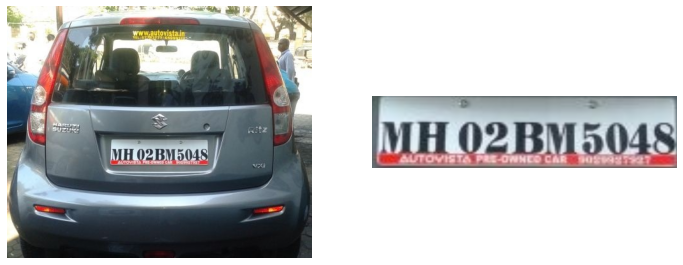

In [ ]:
def preprocess_image(image_path,resize=False):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img

def get_plate(image_path, Dmax=608, Dmin = 608):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=0.1)
    return vehicle, LpImg, cor

test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/N102.jpeg"
vehicle, LpImg,cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

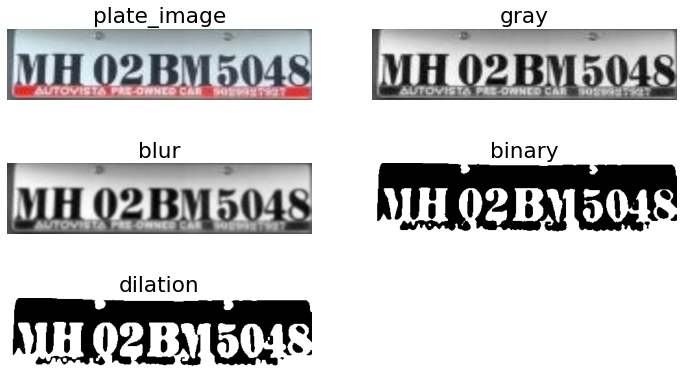

In [ ]:
if (len(LpImg)): #check if there is at least one license image
    # Scales, calculates absolute values, and converts the result to 8-bit.
    plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
    
    # convert to grayscale and blur the image
    gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(7,7),0)
    
    # Applied inversed thresh_binary 
    binary = cv2.threshold(blur, 180, 255,
                         cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)

    
# visualize results    
fig = plt.figure(figsize=(12,7))
plt.rcParams.update({"font.size":18})
grid = gridspec.GridSpec(ncols=2,nrows=3,figure = fig)
plot_image = [plate_image, gray, blur, binary,thre_mor]
plot_name = ["plate_image","gray","blur","binary","dilation"]

for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

NI 0I5H01S


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


MHO2BM5048
MH02BM5048
MH 02BM5048
MH028BY5048
MH02BY5048


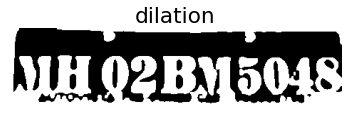

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
erosion = cv2.erode(plot_image[3], k, iterations=2)
plt.imshow(erosion,cmap="gray")
bounds = reader.readtext(erosion)
if len(bounds)>0:
    text=bounds[0][1]
    print(text)
for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    bounds = reader.readtext(plot_image[i])
    if len(bounds)>0:
        text=bounds[0][1]
        print(text)
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

# 3rd Try

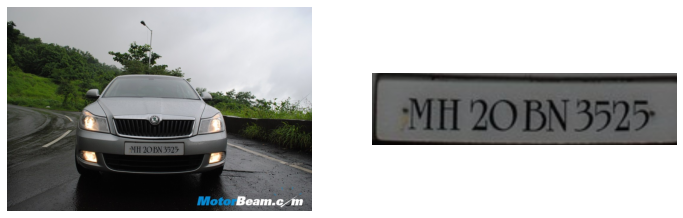

In [ ]:
test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/N137.jpeg"
vehicle, LpImg,cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

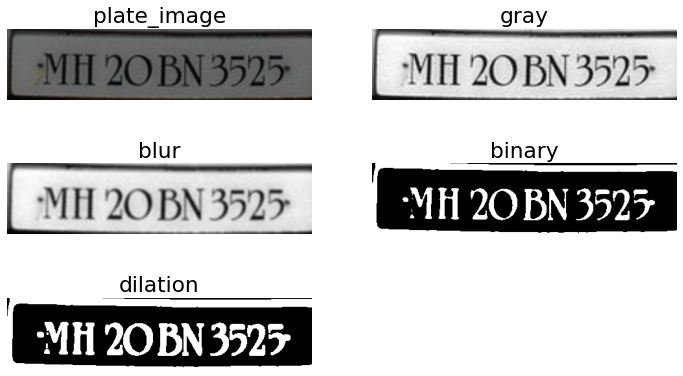

In [ ]:
if (len(LpImg)): #check if there is at least one license image
    # Scales, calculates absolute values, and converts the result to 8-bit.
    plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
    
    # convert to grayscale and blur the image
    gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(7,7),0)
    
    # Applied inversed thresh_binary 
    binary = cv2.threshold(blur, 180, 255,
                         cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)

    
# visualize results    
fig = plt.figure(figsize=(12,7))
plt.rcParams.update({"font.size":18})
grid = gridspec.GridSpec(ncols=2,nrows=3,figure = fig)
plot_image = [plate_image, gray, blur, binary,thre_mor]
plot_name = ["plate_image","gray","blur","binary","dilation"]

for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

VI 2 572 ,


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


MII QOBN 3525
MMHI 2OBN 3525
MMI 2OBN 3525
MH 2OBN 3525
MH 2OBN 3525


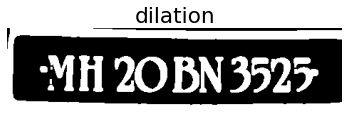

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
erosion = cv2.erode(plot_image[3], k, iterations=2)
plt.imshow(erosion,cmap="gray")
bounds = reader.readtext(erosion)
if len(bounds)>0:
    text=bounds[0][1]
    print(text)
for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    bounds = reader.readtext(plot_image[i])
    if len(bounds)>0:
        text=bounds[0][1]
        print(text)
    if i==0:         
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

# Trial with the given video


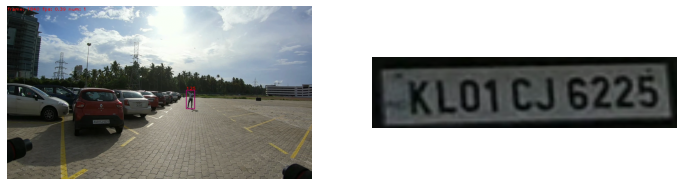

In [ ]:
test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/frames/scene00181.png"
vehicle, LpImg,cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


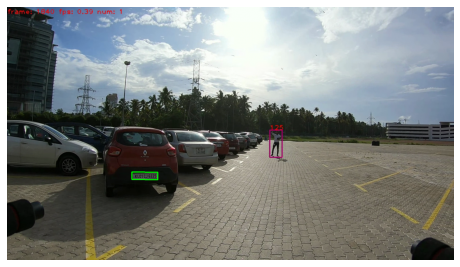

In [ ]:
def draw_box(image_path, cor, thickness=3): 
    pts=[]  
    x_coordinates=cor[0][0]
    y_coordinates=cor[0][1]
    # store the top-left, top-right, bottom-left, bottom-right 
    # of the plate license respectively
    for i in range(4):
        pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
    
    pts = np.array(pts, np.int32)
    pts = pts.reshape((-1,1,2))
    vehicle_image = preprocess_image(image_path)
    
    cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
    return vehicle_image

plt.figure(figsize=(8,8))
plt.axis(False)
plt.imshow(draw_box(test_image_path,cor))

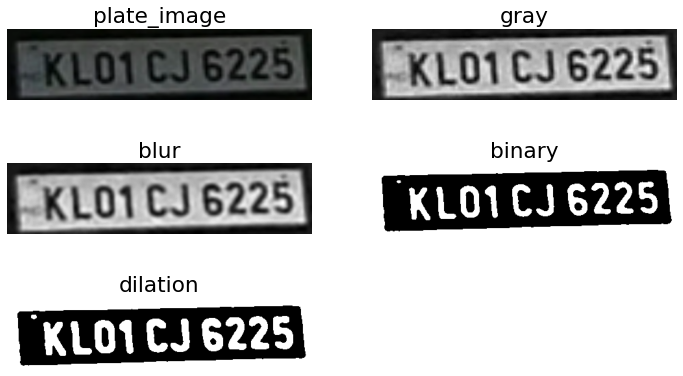

In [ ]:
if (len(LpImg)): #check if there is at least one license image
    # Scales, calculates absolute values, and converts the result to 8-bit.
    plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
    
    # convert to grayscale and blur the image
    gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(7,7),0)
    
    # Applied inversed thresh_binary 
    binary = cv2.threshold(blur, 180, 255,
                         cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)

    
# visualize results    
fig = plt.figure(figsize=(12,7))
plt.rcParams.update({"font.size":18})
grid = gridspec.GridSpec(ncols=2,nrows=3,figure = fig)
plot_image = [plate_image, gray, blur, binary,thre_mor]
plot_name = ["plate_image","gray","blur","binary","dilation"]

for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    if i ==0:
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

KL01CJ 6225


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  del sys.path[0]


KLO1CJ 6225
KLOI CJ 6225
KLOICJ 6225
KLOICJ 6225
KLo1 CJ 6225


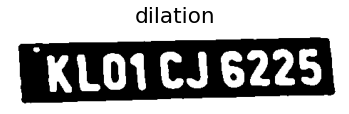

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
k = np.ones((4,2), np.uint8)
erosion = cv2.erode(plot_image[3], k, iterations=2)
plt.imshow(erosion,cmap="gray")
bounds = reader.readtext(erosion)
if len(bounds)>0:
    text=bounds[0][1]
    print(text)
for i in range(len(plot_image)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.title(plot_name[i])
    bounds = reader.readtext(plot_image[i])
    if len(bounds)>0:
        text=bounds[0][1]
        print(text)
    if i==0:         
        plt.imshow(plot_image[i])
    else:
        plt.imshow(plot_image[i],cmap="gray")

## For all the images from the video split into 3 frames per second

K01C J 6225 L
Tc07
KL0TCJ 6225
KLO1
Klo1cJ 6225
KL01€ ) 6225
KLOS AK 58 1
KL0ICJ 6225]
KLO1CJ 6225
KLOLCJ6225
KL 20 P 202
KL29 8 5700
KL 05 AK 50 1
KL L)f L657
0.3o
KLOTCJ 6225
KL01CJ 6225
KLOTCJ 6225
KLO1CJ 6225
0
HKLOZCP8577
1 F L657
M
KLO1CJ 6225
.9
KLO1CJ 6225
30
S:
Ului
KL" 22 F 8297
KLO1
KLOICJ 6225
0mkh
Uwigmy
KL08gh4
 [Y
KL 01 BG 8414
ITt
6
fi am
1c6225
Kl01CJ 6725
Klo1cJ 6225
KL"  12 F A 729 /
Klo1cJ 6225


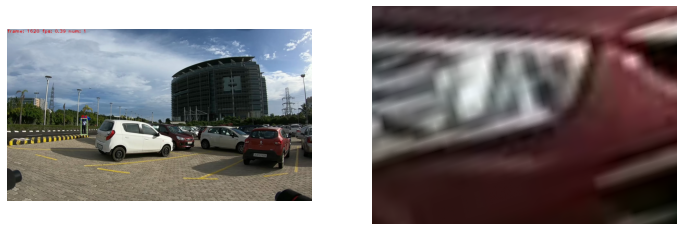

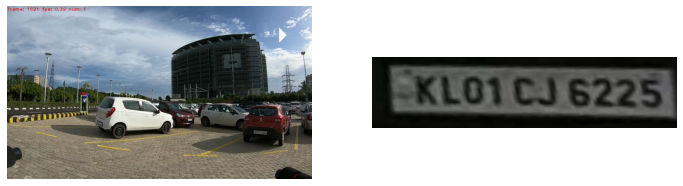

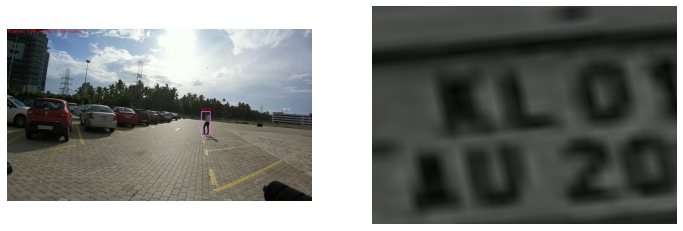

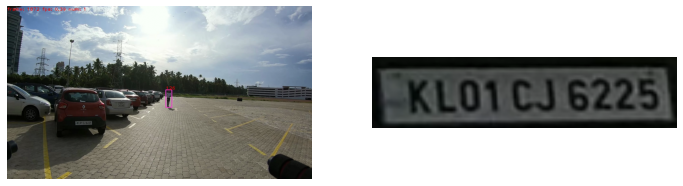

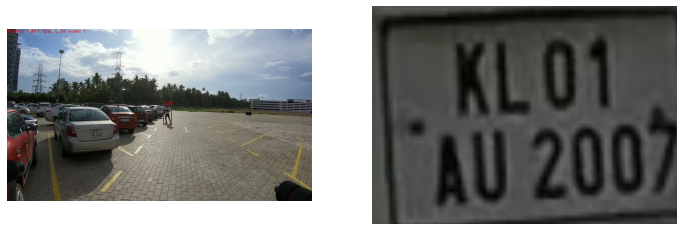

...

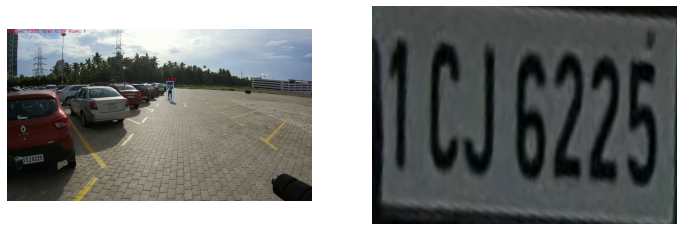

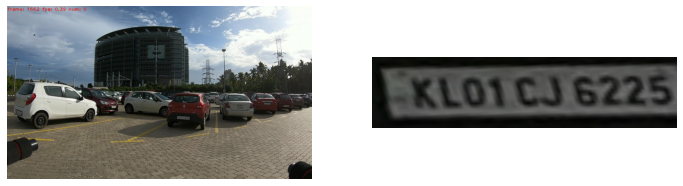

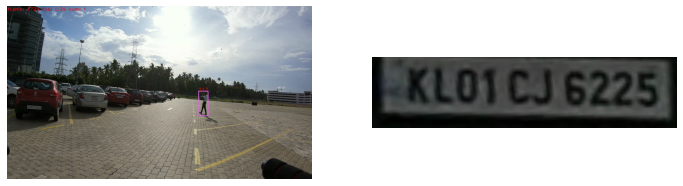

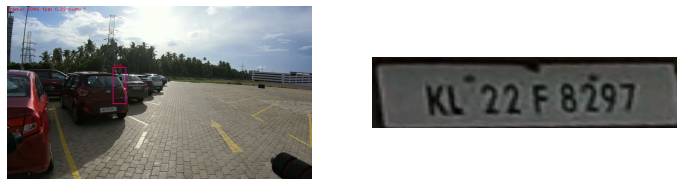

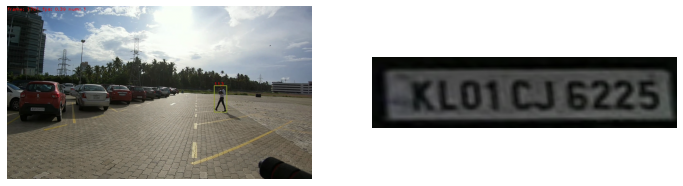

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
path="/content/drive/MyDrive/YOLOv5_LCPlate/frames"
count=0
lc_val={}
for filename in os.listdir(path):
    if filename.endswith("png") :
        test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/frames/"+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        fig = plt.figure(figsize=(12,6))
        grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
        fig.add_subplot(grid[0])
        plt.axis(False)
        plt.imshow(vehicle)
        grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
        fig.add_subplot(grid[1])
        plt.axis(False)
        plt.imshow(LpImg[0])
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        k = np.ones((4,2), np.uint8)
        erosion = cv2.erode(plot_image[3], k, iterations=2)
        bounds = reader.readtext(erosion)
        lc_text=[]
        if len(bounds)>0:
            text=bounds[0][1]
            print(text)
        for i in range(len(plot_image)):
            bounds = reader.readtext(plot_image[i])
            if len(bounds)>0:
                text=bounds[0][1]
                lc_text.append(text)
        lc_val[count]=lc_text

In [ ]:
lc_val

{1: [],
 2: ['KLO1CJ6225', 'KLOICJ6225', 'KLOI0J6225', 'KL01CJ 6225', 'KLo1 cJ 6225'],
 3: ['FU', 'AU', 'TcO', '7re'],
 4: ['KLOT CJ6225',
  'KLO1 CJ6225',
  'KLOTCJ6225',
  'KLo1 CJ 6225',
  'KLo1 CJ 6225'],
 5: ['KLOT', 'KLOT', 'KLOT', 'KL 01', 'KL01'],
 6: ['KLOICJ6225', 'KLOICJ6225', 'KLOICJ6225', 'Klo1 CJ 6225', 'KLO1 CJ 6225'],
 7: ['KLO1CJ6225',
  'KLO1CJ6225',
  'KLOICJ 6225',
  'KL01 CJ 6225',
  'Klo1 CJ 6225'],
 8: ['Jno', 'Jno', 'No', 'KL 05AK 581', 'KL 05 AK 581'],
 9: ['KLOTCJ6225', 'KLOICJ6225', 'KLOTCJ6225', 'KLO1CJ 6225', 'KLOI CJ 6225'],
 10: ['KLOI CJ 6225',
  'KLOI CJ 6225',
  'KLOI CJ 6225',
  'KLO1 CJ 6225',
  'KLOI CJ 6225']}

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
path="/content/drive/MyDrive/YOLOv5_LCPlate/frames"
count=0
lc_val={}
for filename in os.listdir(path):
    if filename.endswith("png") and count<10:
        test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/frames/"+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        # fig = plt.figure(figsize=(12,6))
        # grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
        # fig.add_subplot(grid[0])
        # plt.axis(False)
        # plt.imshow(vehicle)
        # grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
        # fig.add_subplot(grid[1])
        # plt.axis(False)
        # plt.imshow(LpImg[0])
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        k = np.ones((4,2), np.uint8)
        erosion = cv2.erode(plot_image[3], k, iterations=2)
        bounds = reader.readtext(erosion)
        lc_text=[]
        if len(bounds)>0:
            text=bounds[0][1]
            print(text)
        for i in range(len(plot_image)):
            bounds = reader.readtext(plot_image[i])
            if len(bounds)>0:
                text=bounds[0][1]
                lc_text.append(text)
        lc_val[count]=lc_text

K01C J 6225 L
Tc07
KL0TCJ 6225
KLO1
Klo1cJ 6225
KL01€ ) 6225
KLOS AK 58 1
KL0ICJ 6225]
KLO1CJ 6225


In [ ]:
lc_val


{1: [],
 2: ['KLO1CJ6225', 'KLOICJ6225', 'KLOI0J6225', 'KL01CJ 6225', 'KLo1 cJ 6225'],
 3: ['FU', 'AU', 'TcO', '7re'],
 4: ['KLOT CJ6225',
  'KLO1 CJ6225',
  'KLOTCJ6225',
  'KLo1 CJ 6225',
  'KLo1 CJ 6225'],
 5: ['KLOT', 'KLOT', 'KLOT', 'KL 01', 'KL01'],
 6: ['KLOICJ6225', 'KLOICJ6225', 'KLOICJ6225', 'Klo1 CJ 6225', 'KLO1 CJ 6225'],
 7: ['KLO1CJ6225',
  'KLO1CJ6225',
  'KLOICJ 6225',
  'KL01 CJ 6225',
  'Klo1 CJ 6225'],
 8: ['Jno', 'Jno', 'No', 'KL 05AK 581', 'KL 05 AK 581'],
 9: ['KLOTCJ6225', 'KLOICJ6225', 'KLOTCJ6225', 'KLO1CJ 6225', 'KLOI CJ 6225'],
 10: ['KLOI CJ 6225',
  'KLOI CJ 6225',
  'KLOI CJ 6225',
  'KLO1 CJ 6225',
  'KLOI CJ 6225']}

# Using paddle ocr


In [ ]:
!python3 -m pip install paddlepaddle-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 393.8 MB 20 kB/s 
     |████████████████████████████████| 394 kB 65.5 MB/s 


In [ ]:
pip install "paddleocr>=2.0.1" # Recommend to use version 2.0.1+

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 334 kB 18.6 MB/s 
     |████████████████████████████████| 2.8 MB 55.6 MB/s 
     |████████████████████████████████| 50 kB 7.7 MB/s 
     |████████████████████████████████| 948 kB 55.0 MB/s 
     |████████████████████████████████| 604 kB 52.2 MB/s 
     |████████████████████████████████| 55.7 MB 65 kB/s 
     |████████████████████████████████| 399 kB 56.1 MB/s 
     |████████████████████████████████| 204 kB 55.9 MB/s 
     |████████████████████████████████| 2.3 MB 48.3 MB/s 
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149863 sha256=802a0e66f04f510cb68cc22efe05d3c746f0b5cbb98314d0f3885370beadfef5
  Stored in directory: /root/.cache/pip/wheels/05/5f/ca/7c4367734892581bb5ff896f15027a932c551080b2abd3e00d
Successfully built python-Levenshtein
  Attempting uninstall: opencv-contrib-python
    

In [ ]:


ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

NameError: ignored

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
# from functools import reduce
# def remove(string):
#     return reduce(lambda x, y: (x+y) if (y != " ") else x, string, "");
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/YOLOv5_LCPlate/frames"
count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
for filename in os.listdir(path):
    if filename.endswith("png"):
        test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/frames/"+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        for i in range(len(plot_image)):
            bounds = ocr.ocr(plot_image[i], cls=True)
            if len(bounds)>0:
                text=bounds[0][1][0]
                text=text.replace("-", "")
                text=text.replace(" ", "")
                text=text.upper()
            if re.fullmatch(pattern, text) and text[0]!='X':
                    lc_set.add(text)
                

/usr/local/lib/python3.7/dist-packages/yaml/constructor.py:126: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  if not isinstance(key, collections.Hashable):


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3.86M/3.86M [00:06<00:00, 599kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv3_rec_infer/en_PP-OCRv3_rec_infer.tar


100%|██████████| 9.96M/9.96M [00:08<00:00, 1.22MiB/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 1.45M/1.45M [00:03<00:00, 425kiB/s]

[2022/07/16 15:49:06] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

NameError: ignored

In [ ]:
import re
text='KL01CJ6225'
try:
    re.compile(r"^[A-Z]{2}[ -][0-9]{1,2}(?: [A-Z])?(?: [A-Z]*)? [0-9]{4}$")
    print("works")
except re.error:
    print("Non valid regex pattern")
    exit()

works


In [ ]:
import re
pattern=re.compile(r"^[A-Z]{2}[0-9]{1,2}(?:[A-Z])?(?:[A-Z]*)?[0-9]{4}$")
test="XL01CJ6225"
if re.fullmatch(pattern, test):
    print(f"'{test}' is an alphanumeric string!")

'XL01CJ6225' is an alphanumeric string!


In [ ]:
lc_val

{1: [],
 2: ['KL01CJ6225', 'KL01CJ6225', 'KL01CJ6225', 'Kl01 CJ 6225', 'KL01 CJ 6225'],
 3: ['KLO', 'KLO', 'KLO', 'Lo', '.o'],
 4: ['KL01CJ6225', 'KL01CJ6225', 'KL01CJ6225', 'KL0i cJ 6225', 'KL01 CJ 6225'],
 5: ['KL01', 'KL01', 'KL01', 'KL01', 'KL01'],
 6: ['KL01CJ6225', 'KL01CJ6225', 'KL01CJ6225', 'KL01 CJ 6225', 'KL01 CJ 6225'],
 7: ['KL01CJ6225', 'KL01CJ6225', 'KL01CJ6225', 'KL0i Cj 6225', 'KL0} CJ 6225'],
 8: ['L05AK581', 'L05AK581', 'KL05AK581', 'KL 05 AK 581', 'KL 05 AK 581'],
 9: ['KL01CJ6225', 'KL01CJ6225', 'KL01CJ6225', 'KL01 Cj 6225', 'XL01 CJ 6225'],
 10: ['KL01CJ6225',
  'KL01CJ6225',
  'KL01CJ6225',
  'KL01 CJ 6225',
  'KL01 CJ 6225'],
 11: ['KLO1CJ.6225',
  'KLO1CJ.6225',
  'KLO1CJ.6225',
  'KLO1 CJ 622S',
  'KLO1 CJ 6225'],
 12: ['KL20 P202', 'KL20 P202', 'KL20 P 202', 'KL 20 P 202', 'KL 20 P 202'],
 13: ['KL29B5780',
  'KL29B5780',
  'KL29B5780',
  ': KL 29 B 5780',
  ': KL 29 B 5780'],
 14: ['KL05AK581', 'KL05AK581', 'KL05AK581', 'KL 0S AK S8 1', 'KL 0S AK S81'],
 15: 

In [ ]:
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
text='KL01BG 8414'
text.replace(' ',"")
text.replace("-","")
text
if re.fullmatch(pattern, text):
    print(f"'{text}' is an alphanumeric string!")

'KL01BG 8414' is an alphanumeric string!


In [ ]:
lc_set

{'KL01BG8414',
 'KL01CJ6225',
 'KL05AK581',
 'KL07CP8577',
 'KL20P202',
 'KL22F8297',
 'KL29B5780',
 'KL41F4657',
 'KT01CJ6225'}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


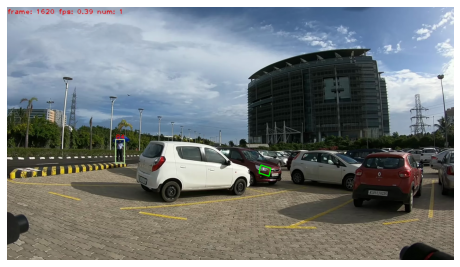

In [ ]:
def draw_box(image_path, cor, thickness=3): 
    pts=[]  
    x_coordinates=cor[0][0]
    y_coordinates=cor[0][1]
    # store the top-left, top-right, bottom-left, bottom-right 
    # of the plate license respectively
    for i in range(4):
        pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
    
    pts = np.array(pts, np.int32)
    pts = pts.reshape((-1,1,2))
    vehicle_image = preprocess_image(image_path)
    # print(pts)
    # bottomLeftCornerOfText = (pts[0][0],pts[0][1])
    cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
    return vehicle_image

plt.figure(figsize=(8,8))
plt.axis(False)
plt.imshow(draw_box(test_image_path,cor))

# Write some Text

# font                   = cv2.FONT_HERSHEY_SIMPLEX
# fontScale              = 1
# fontColor              = (255,255,255)
# thickness              = 1
# lineType               = 2

# cv2.putText(img,'Hello World!', 
#     bottomLeftCornerOfText, 
#     font, 
#     fontScale,
#     fontColor,
#     thickness,
#     lineType)

 [[1090  679]]


TypeError: ignored

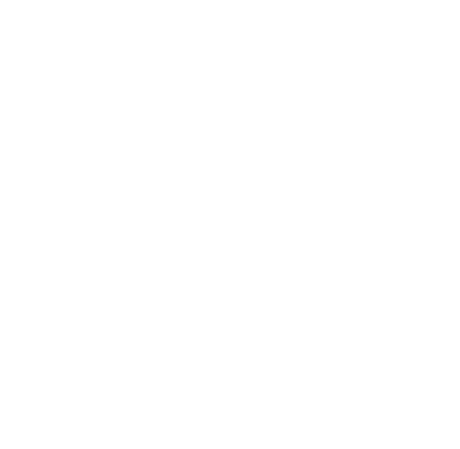

In [ ]:
#Labelling
font                   = cv2.FONT_HERSHEY_SIMPLEX
fontScale              = 1
fontColor              = (255,255,255)
thickness              = 1
lineType               = 2

def draw_box(image_path, cor, thickness=3,label_text=""): 
    pts=[]  
    x_coordinates=cor[0][0]
    y_coordinates=cor[0][1]
    # store the top-left, top-right, bottom-left, bottom-right 
    # of the plate license respectively
    for i in range(4):
        pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
    
    pts = np.array(pts, np.int32)
    pts = pts.reshape((-1,1,2))
    vehicle_image = preprocess_image(image_path)
    # cv2.putText(vehicle_image,label_text, 
    #     {int(x_coordinates[0]),int(y_coordinates[0])}, 
    #     font, 
    #     fontScale,
    #     fontColor,
    #     thickness,
    #     lineType)
    # print(thickness,pts[0])
    cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
    return vehicle_image
plt.figure(figsize=(8,8))
plt.axis(False)
plt.imshow(draw_box(test_image_path,cor,label))

[2022/07/11 13:39:28] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

TypeError: ignored

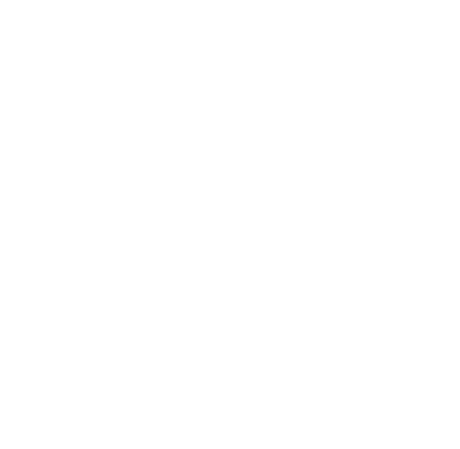

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/YOLOv5_LCPlate/frames"
count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
for filename in os.listdir(path):
    if filename.endswith("png"):
        label=""
        text=""
        test_image_path = "/content/drive/MyDrive/YOLOv5_LCPlate/frames/"+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        for i in range(len(plot_image)):
            bounds = ocr.ocr(plot_image[i], cls=True)
            if len(bounds)>0:
                text=bounds[0][1][0]
                text=text.replace("-", "")
                text=text.replace(" ", "")
                text=text.upper()
            if re.fullmatch(pattern, text) and text[0]!='X':
                    lc_set.add(text)
                    label=text
            print(label)
        if len(label)>0:
            plt.figure(figsize=(8,8))
            plt.axis(False)
            plt.imshow(draw_box(test_image_path,cor,label))

In [ ]:
# #Labelling
# font                   = cv2.FONT_HERSHEY_SIMPLEX
# fontScale              = 1
# fontColor              = (255,255,255)
# thickness              = 1
# lineType               = 2

def draw_box(image_path, cor, label_inp='OpenCV',thickness=3 ): 
    pts=[]  
    x_coordinates=cor[0][0]
    y_coordinates=cor[0][1]
    # store the top-left, top-right, bottom-left, bottom-right 
    # of the plate license respectively
    for i in range(4):
        pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
    
    pts = np.array(pts, np.int32)
    pts = pts.reshape((-1,1,2))
    vehicle_image = preprocess_image(image_path)

    cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
    

    # font
    font = cv2.FONT_HERSHEY_SIMPLEX

    # org
    org = (int(x_coordinates[0]),int(y_coordinates[0]))

    # fontScale
    fontScale = 2

    # Blue color in BGR
    color = (255, 255, 0)

    # Line thickness of 2 px
    thickness = 2

    # Using cv2.putText() method
    vehicle_image = cv2.putText(vehicle_image, label_inp, org, font, fontScale, color, thickness, cv2.LINE_AA)

    return vehicle_image

## GOLDEN CELL

In [ ]:
def preprocess_image(img,resize=False):
    # img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img

def get_plate(image_path, Dmax=608, Dmin = 608,threshold=0.1):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=threshold)
    return vehicle, LpImg, cor


In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/YOLOv5_LCPlate/frames/"

count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
for filename in os.listdir(path):
    if filename.endswith("png") or filename.endswith("jpg"):
        label=""
        text=""
        test_image_path = path+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        for i in range(len(plot_image)):
            bounds = ocr.ocr(plot_image[i], cls=True)
            if len(bounds)>0:
                text=bounds[0][1][0]
                text=text.replace("-", "")
                text=text.replace(" ", "")
                text=text.upper()
            if re.fullmatch(pattern, text) and text[0]!='X':
                    lc_set.add(text)
                    label=text
        if count>5 and count<10:
            plt.figure(figsize=(16,16))
    def draw_box(image_path, lc_label,thickness=3 ): 
    # font
    font = cv2.FONT_HERSHEY_SIMPLEX
    # fontScale
    fontScale = 2
    # Blue color in BGR
    color = (255, 255, 0)
    # Line thickness of 2 px
    thickness = 2
    vehicle_image = preprocess_image(image_path)
…            pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
        
        pts = np.array(pts, np.int32)
        pts = pts.reshape((-1,1,2))
        cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
        # Using cv2.putText() method
        cv2.putText(vehicle_image, lc_label[j][1], org, font, fontScale, color, thickness, cv2.LINE_AA)
    lc_label=[]
    return vehicle_image        plt.axis(False)
            plt.imshow(draw_box(test_image_path,cor,label))

In [ ]:
import os
import cv2
# from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/OCR/sdf.jpeg"

count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
label=""
text=""
test_image_path = path
print("test_image_path",test_image_path)
test_image_path=cv2.imread(test_image_path)
vehicle, LpImg,cor = get_plate(test_image_path)
count+=1
print("check2")
if (len(LpImg)): #check if there is at least one license image
    # Scales, calculates absolute values, and converts the result to 8-bit.
    plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
    # convert to grayscale and blur the image
    gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(7,7),0)
    
    # Applied inversed thresh_binary 
    binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
print("check3")
plot_image = [plate_image, gray, blur, binary,thre_mor]
plot_name = ["plate_image","gray","blur","binary","dilation"]
for i in range(len(plot_image)):
    bounds = ocr.ocr(plot_image[i], cls=True)
    if len(bounds)>0:
        text=bounds[0][1][0]
        text=text.replace("-", "")
        text=text.replace(" ", "")
        text=text.upper()
    if re.fullmatch(pattern, text) and text[0]!='X':
            lc_set.add(text)
            label=text
# print("check4")
# if count>5 and count<10:
#     plt.figure(figsize=(16,16))
#     plt.axis(False)
#     plt.imshow(draw_box(test_image_path,cor,label))

[2022/07/16 18:29:01] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

In [ ]:
lc_set

set()

[2022/07/16 13:28:39] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

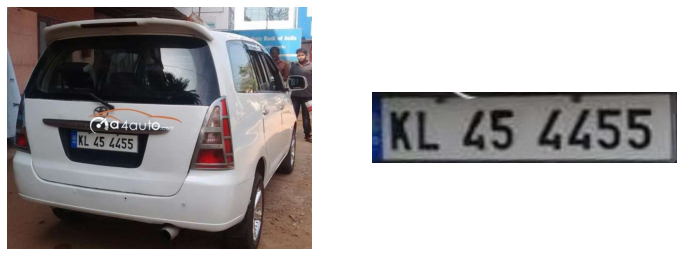

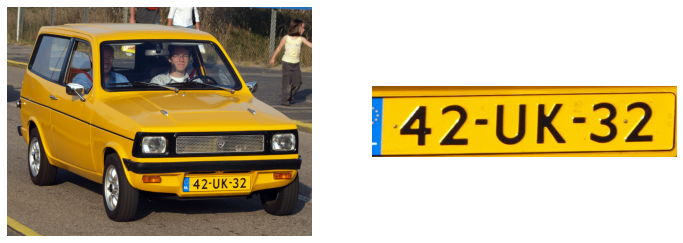

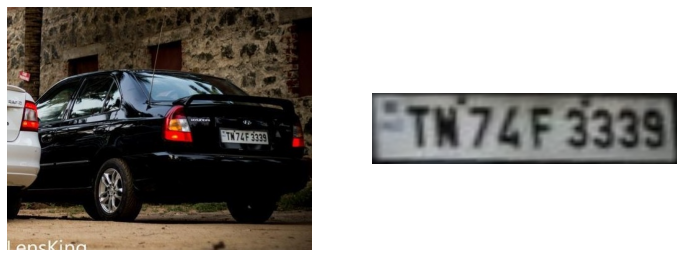

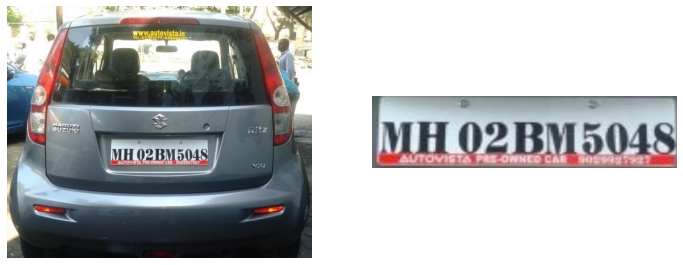

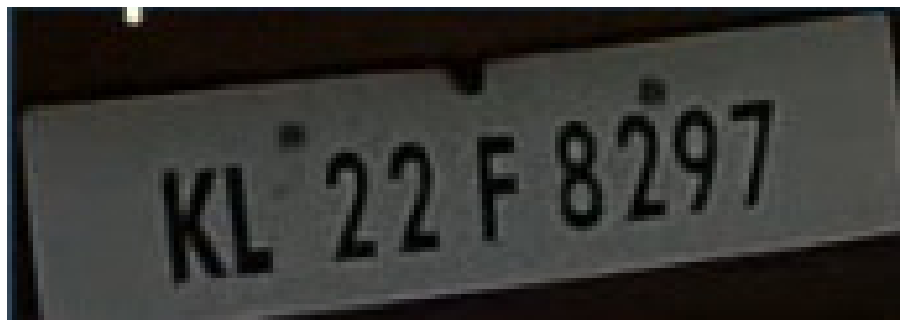

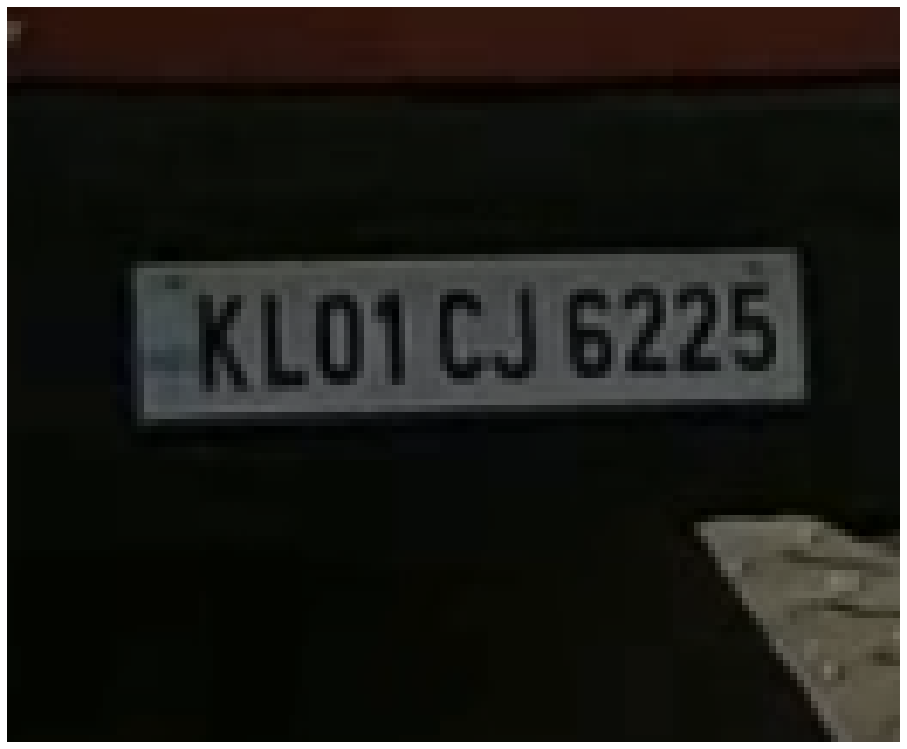

In [ ]:
import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/YOLOv5_LCPlate/"

count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
for filename in os.listdir(path):
    if filename.endswith("png") or filename.endswith("jpeg"):
        label=""
        text=""
        test_image_path = path+filename
        print(test_image_path)
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            plate_image = cv2.convertScaleAbs(LpImg[0], alpha=(255.0))
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
            fig = plt.figure(figsize=(12,6))
            grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
            fig.add_subplot(grid[0])
            plt.axis(False)
            plt.imshow(vehicle)
            grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
            fig.add_subplot(grid[1])
            plt.axis(False)
            plt.imshow(LpImg[0])
        plot_image = [plate_image, gray, blur, binary,thre_mor]
        plot_name = ["plate_image","gray","blur","binary","dilation"]
        for i in range(len(plot_image)):
            bounds = ocr.ocr(plot_image[i], cls=True)
            if len(bounds)>0:
                text=bounds[0][1][0]
                text=text.replace("-", "")
                text=text.replace(" ", "")
                text=text.upper()
            if re.fullmatch(pattern, text) and text[0]!='X':
                    lc_set.add(text)
                    label=text
        if count>5 and count<10:
            plt.figure(figsize=(16,16))
            plt.axis(False)
            plt.imshow(draw_box(test_image_path,cor,label))

In [ ]:
lc_set

{'MH02BM5048', 'MI02BM5048', 'TW74F3339', 'TX7LF3333'}

# Trial for multiple License plate object detection


In [ ]:
def draw_box(image_path, lc_label,thickness=3 ): 
    # font
    font = cv2.FONT_HERSHEY_SIMPLEX
    # fontScale
    fontScale = 2
    # Blue color in BGR
    color = (255, 255, 0)
    # Line thickness of 2 px
    thickness = 2
    vehicle_image = preprocess_image(image_path)
    # print(lc_label)
    for j in range(len(lc_label)):
        pts=[]  
        x_coordinates=lc_label[j][0][0]
        y_coordinates=lc_label[j][0][1]
        # org
        org = (int(x_coordinates[0]),int(y_coordinates[0]))
        # store the top-left, top-right, bottom-left, bottom-right 
        # of the plate license respectively
        for i in range(4):
            pts.append([int(x_coordinates[i]),int(y_coordinates[i])])
        
        pts = np.array(pts, np.int32)
        pts = pts.reshape((-1,1,2))
        cv2.polylines(vehicle_image,[pts],True,(0,255,0),thickness)
        # Using cv2.putText() method
        cv2.putText(vehicle_image, lc_label[j][1], org, font, fontScale, color, thickness, cv2.LINE_AA)
    lc_label=[]
    return vehicle_image

import os
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
from paddleocr import PaddleOCR,draw_ocr
import re
pattern=re.compile(r"^[A-Za-z]{2}[0-9]{1,2}[A-Za-z]{1,2}[ ]{0,1}[0-9]{3,4}$")
lc_set=set()
path="/content/drive/MyDrive/YOLOv5_LCPlate/"

count=0
lc_val={}
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
for filename in os.listdir(path):
    if filename.endswith("png") or filename.endswith("jpg"):
        label=""
        text=""
        lc_label=[]
        test_image_path = path+filename
        vehicle, LpImg,cor = get_plate(test_image_path)
        count+=1
        for k in range(len(LpImg)):
        # if (len(LpImg)): #check if there is at least one license image
            # Scales, calculates absolute values, and converts the result to 8-bit.
            label=""
            plate_image = cv2.convertScaleAbs(LpImg[k], alpha=(255.0))
            # convert to grayscale and blur the image
            gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray,(7,7),0)
            
            # Applied inversed thresh_binary 
            binary = cv2.threshold(blur, 180, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel3)
            plot_image = [plate_image, gray, blur, binary,thre_mor]
            plot_name = ["plate_image","gray","blur","binary","dilation"]
            for i in range(len(plot_image)):
                bounds = ocr.ocr(plot_image[i], cls=True)
                if len(bounds)>0:
                    text=bounds[0][1][0]
                    text=text.replace("-", "")
                    text=text.replace(" ", "")
                    text=text.upper()
                if re.fullmatch(pattern, text) and text[0]!='X':
                    lc_set.add(text)
                    label=text
            if len(label):
                list_temp=[]
                list_temp.append(cor[k])
                list_temp.append(label)
                lc_label.append(list_temp)
        if len(lc_label):
            plt.figure(figsize=(16,16))
            plt.axis(False)
            plt.imshow(draw_box(test_image_path,lc_label))
            

[2022/07/16 13:04:57] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f